<a href="https://colab.research.google.com/github/rahul-venkat/Image-Analysis-project/blob/main/Image_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#Image analysis final semester project by Rahul Venkatesan - 122102012

#Installing dependencies:
!pip install cython pyyaml==5.1

#Installing detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

#Install pyTorch:
!pip install torch==1.5.0 torchvision==0.6.0

In [2]:
#Setting up detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

#Importing required libraries
import numpy as np
import pandas as pd
import cv2
import random
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

#Importing required detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [3]:
#Setting up model zoo with Faster R-CNN and appropriate baseline

cfg = get_cfg()

cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9 

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_C4_3x.yaml")
predictor = DefaultPredictor(cfg)

model_final_f97cb7.pkl: 136MB [00:02, 57.7MB/s]                           


In [4]:
#Input image
img = cv2.imread("CCTV view.jpg")

#print (img)

#Testing the model
outputs = predictor(img)

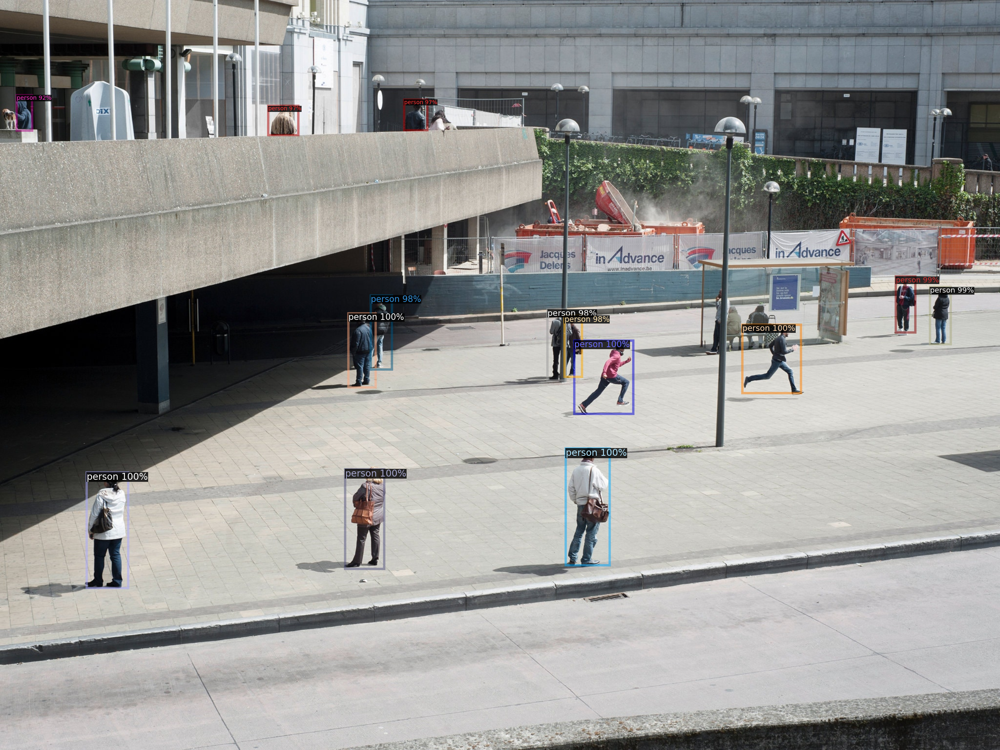

In [5]:
#Using `Visualizer` to draw the predictions on the image

v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
cv2_imshow(v.get_image()[:, :, ::-1])

In [6]:
#Incase of multiple objects, this will give a list of all classes identified

classes=outputs['instances'].pred_classes.cpu().numpy()
#print(classes)

In [7]:
#Printing the bounding boxes of all ID'd objects

bbox=outputs['instances'].pred_boxes.tensor.cpu().numpy()
#print(bbox)

In [8]:
#Its clear that persons have class = 0

ind = np.where(classes==0)[0]

#Bounding box of only persons

person=bbox[ind]

#Total no. of persons

num= len(person)

In [9]:
#Testing the bounding box of one person

x1,y1,x2,y2 = person[0]
print(x1,y1,x2,y2)

1157.998 919.05475 1248.5842 1157.9053


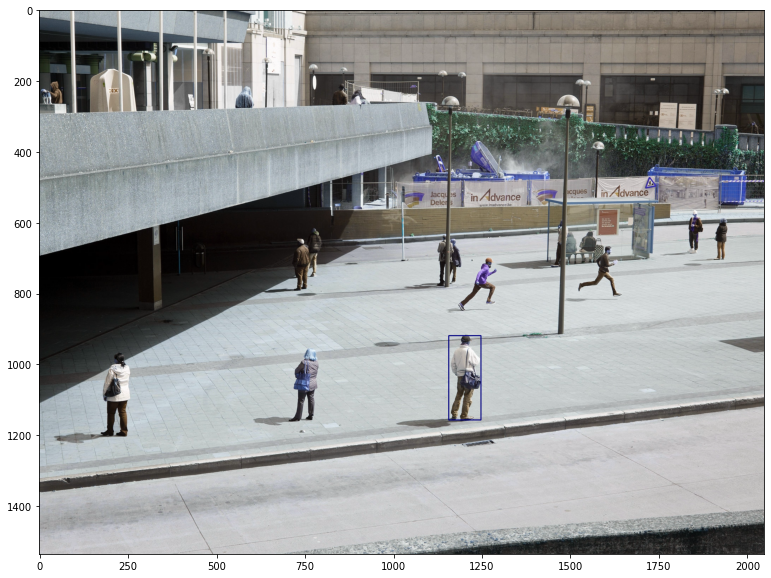

In [13]:
img = cv2.imread('CCTV view.jpg')
_ = cv2.rectangle(img, (x1, y1), (x2, y2), (0,0,128), 2)

plt.figure(figsize=(20,10))
plt.imshow(img)

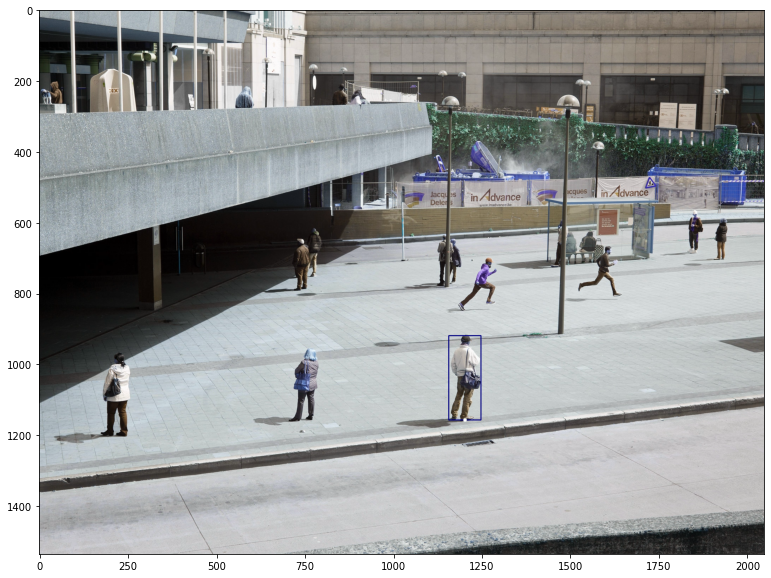

In [14]:
#Calculating the Center of the bottom edge of the bounding box

x_center = int((x1+x2)/2)
y_center = int(y2)

center = (x_center, y_center)

_ = cv2.circle(img, center, 5, (255, 255, 255), -1)
plt.figure(figsize=(20,10))
plt.imshow(img)

In [15]:
#Using the same logic to define a function to find the bottom middle of all persons

def mid_point(img,person,idx):

  x1,y1,x2,y2 = person[idx]
  _ = cv2.rectangle(img, (x1, y1), (x2, y2), (0,255,0), 2)
  
  x_mid = int((x1+x2)/2)
  y_mid = int(y2)
  mid   = (x_mid,y_mid)
  
  _ = cv2.circle(img, mid, 5, (255, 255, 255), -1)
  cv2.putText(img, str(idx), mid, cv2.FONT_HERSHEY_SIMPLEX,1, (0, 0, 0), 2, cv2.LINE_AA)
  
  return mid

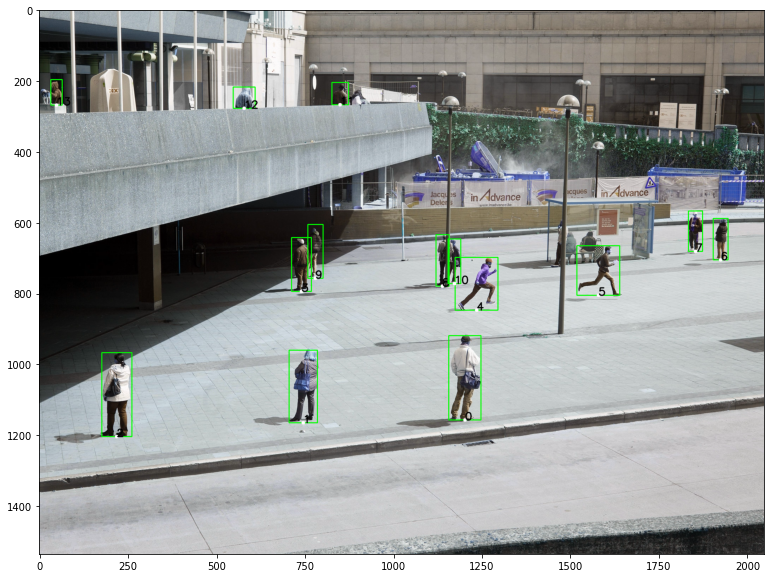

In [16]:
#Storing all the midpoints in a list

midpoints = [mid_point(img,person,i) for i in range(len(person))]

#Visualising the image with all the bounding boxes

plt.figure(figsize=(20,10))
plt.imshow(img)

In [23]:
#Defining a function to calculate the euclidean distance between all possible
#pairs of persons

%%time
from scipy.spatial import distance
def compute_distance(midpoints,num):
  dist = np.zeros((num,num))
  for i in range(num):
    for j in range(i+1,num):
      if i!=j:
        dst = distance.euclidean(midpoints[i], midpoints[j])
        dist[i][j]=dst
  return dist

CPU times: user 12 µs, sys: 0 ns, total: 12 µs
Wall time: 16 µs


In [24]:
dist = compute_distance(midpoints,num)

In [25]:
#Defining a function to find the pairs of persons who are close 
#to each other. Using threshold = 100

%%time
def find_closest(dist,num,thresh):
  p1=[]
  p2=[]
  d=[]
  for i in range(num):
    for j in range(i,num):
      if( (i!=j) & (dist[i][j]<=thresh)):
        p1.append(i)
        p2.append(j)
        d.append(dist[i][j])
  return p1,p2,d

CPU times: user 4 µs, sys: 1 µs, total: 5 µs
Wall time: 8.11 µs


In [20]:

thresh=100
p1,p2,d=find_closest(dist,num,thresh)

#Visualizing the persons close to each other using dataframes

df = pd.DataFrame({"Person 1":p1,"Person 2":p2,"Distance":d})
df

,Person 1,Person 2,Distance
0,3,9,53.758720
1,4,10,97.948966
2,6,7,74.946648
3,8,10,34.713110


In [21]:
#Changing the bounding box colours of people violating the social distancing
#rules to red

def change_2_red(img,person,p1,p2):
  risky = np.unique(p1+p2)
  for i in risky:
    x1,y1,x2,y2 = person[i]
    _ = cv2.rectangle(img, (x1, y1), (x2, y2), (255,0,0), 2)  
  return img

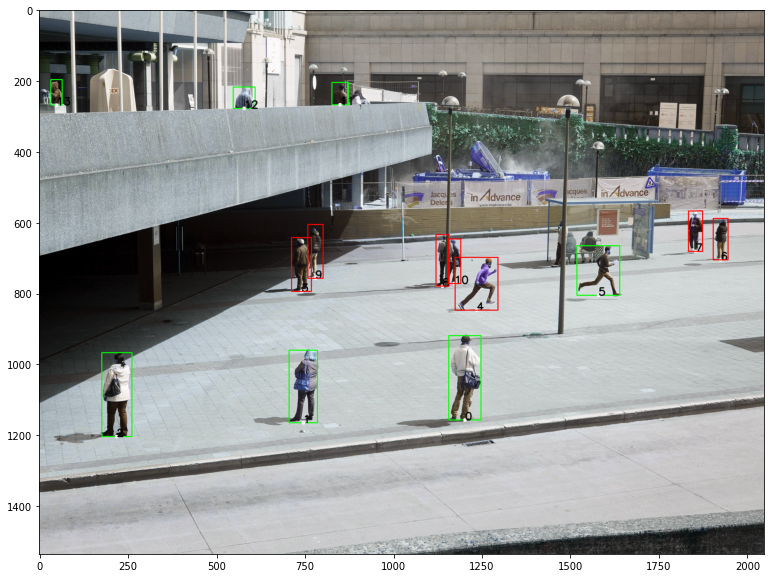

In [22]:
#Final result

img = change_2_red(img,person,p1,p2)

plt.figure(figsize=(20,10))
plt.imshow(img)